# Week 9 Gaussian Processes Assignment

For conveneince, I'm duplicating the main discussion here, although originally it followed most of the code. Additionally, the notebook is available on my GitHub: https://github.com/guydav/minerva/blob/master/notebooks/CS156/9.X%20GP%20Weather%20Data.ipynb

Note: the HTML tables look ugly in the latex-generated-PDF. Please examine them in the link above.

## Main results table:

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  Simple RBF // 20 points</th><th style="text-align: right;">     Periodic</th><th style="text-align: right;">  Periodic // 20 points</th><th style="text-align: right;">  Periodic + RBF</th><th style="text-align: right;">  Periodic x RBF</th><th style="text-align: right;">  Complicated</th><th style="text-align: right;">  Two Periodics</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">            179.717      </td><td style="text-align: right;">238.209      </td><td style="text-align: right;">         1089.55       </td><td style="text-align: right;">   851.051      </td><td style="text-align: right;">   525.182      </td><td style="text-align: right;">660.451      </td><td style="text-align: right;"> 1553.94       </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;">             -1.46483e+06</td><td style="text-align: right;"> -1.46472e+06</td><td style="text-align: right;">           -1.46341e+06</td><td style="text-align: right;">    -1.46227e+06</td><td style="text-align: right;">    -1.46429e+06</td><td style="text-align: right;"> -1.46483e+06</td><td style="text-align: right;">   -1.46391e+06</td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">              0.444586   </td><td style="text-align: right;">  0.426354   </td><td style="text-align: right;">            1.1472     </td><td style="text-align: right;">     0.645425   </td><td style="text-align: right;">     0.668425   </td><td style="text-align: right;">  1.15111    </td><td style="text-align: right;">    0.826235   </td></tr>
<tr><td>Train MSE              </td><td style="text-align: right;">             62.2132     </td><td style="text-align: right;"> 62.1743     </td><td style="text-align: right;">           61.7584     </td><td style="text-align: right;">    60.4676     </td><td style="text-align: right;">    62.027      </td><td style="text-align: right;"> 62.2132     </td><td style="text-align: right;">   61.9132     </td></tr>
<tr><td>Validation predict time</td><td style="text-align: right;">              0.10399    </td><td style="text-align: right;">  0.110728   </td><td style="text-align: right;">            0.248054   </td><td style="text-align: right;">     0.172234   </td><td style="text-align: right;">     0.18512    </td><td style="text-align: right;">  0.303316   </td><td style="text-align: right;">    0.229346   </td></tr>
<tr><td>MSE                    </td><td style="text-align: right;">             57.0997     </td><td style="text-align: right;"> 57.1362     </td><td style="text-align: right;">           56.8642     </td><td style="text-align: right;">    55.1338     </td><td style="text-align: right;">    57.8444     </td><td style="text-align: right;"> 57.0997     </td><td style="text-align: right;">   56.838      </td></tr>
<tr><td>MeanAE                 </td><td style="text-align: right;">              6.14151    </td><td style="text-align: right;">  6.14993    </td><td style="text-align: right;">            6.11645    </td><td style="text-align: right;">     6.02809    </td><td style="text-align: right;">     6.15861    </td><td style="text-align: right;">  6.14151    </td><td style="text-align: right;">    6.12901    </td></tr>
<tr><td>MedianAE               </td><td style="text-align: right;">              5.38143    </td><td style="text-align: right;">  5.3913     </td><td style="text-align: right;">            5.43996    </td><td style="text-align: right;">     5.33962    </td><td style="text-align: right;">     5.34023    </td><td style="text-align: right;">  5.38143    </td><td style="text-align: right;">    5.37859    </td></tr>
</tbody>
</table>

## Discussion

Technical notes:
* All models were Sparse GP models.
* Each model uses a different covariance function, but without any optimization of the hyperparemters, beyond as performed by the optimization routine. See bullet 3. The covariance functions include a simple RBF, a periodic function (sinusodial), a sum of periodic and RBF, a product, a different linear combination of kernels (RBF + RBF x periodic + Rational Quadratic + white noise), and a sum of two periodics.
* Other than two models run with 20 inducing points, all models were ran with 10 inducing points, sampled uniformly from the range of the data (day of year up to 365, time of day up to 1440).
* All models were affored three restarts of the optimization procedure.

Several interesting observations from this exercise:
1. This training regime is probably rather inefficient. I'm fairly sure we could extract out a smaller subset of samples to use in training and not lose all that much in performance. It would be interesting to quantify it by fitting the same models on increasingly large subsamples of the training set and observing the performance.
2. The optimization procedure doesn't appear to reinitialize the hyperparameter values beyond their initially assigned values - in other words, every initialization of the optimization appears to search locally around the same initial parameters. Another intersting exercises would be to create the same type of model, sampling initial kernel hyperparameters (akin to how Sklearn's hyperparameter searches work), and fitting a GP for each. 
3. The results, without further optimization, appear substantially outperformed by the LPM. The LPM achieves an MSE of under half the best GP fit, with much far faster fit and prediction times. Sad.

### See limited investigations of 1 and 2 below

For reference, my LPM model from last week achieved the following results: 
* Cross-validation time (on the 2011-2014 data): 3.1 seconds
* Fit time (best cross-validated choice on 2011-2014 data): 0.35 seconds
* Prediction time (validation set, 2015 data): 0.025 seconds
* Validation set MSE: 25.57
* Validation MAE (mean absolute error): 4.21
* Validation median absolute error: 3.84

## Results of training with smaller training set:

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  0.17% of data</th><th style="text-align: right;">  0.33% of data</th><th style="text-align: right;">  0.50% of data</th><th style="text-align: right;">  0.67% of data</th><th style="text-align: right;">  0.83% of data</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">     502.192   </td><td style="text-align: right;">     124.668   </td><td style="text-align: right;">     481.343   </td><td style="text-align: right;">     452.246   </td><td style="text-align: right;">  351.267      </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;"> -215943       </td><td style="text-align: right;"> -488098       </td><td style="text-align: right;"> -731819       </td><td style="text-align: right;"> -972623       </td><td style="text-align: right;">   -1.21993e+06</td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">       0.678716</td><td style="text-align: right;">       0.747536</td><td style="text-align: right;">       0.739104</td><td style="text-align: right;">       0.686118</td><td style="text-align: right;">    0.689748   </td></tr>
<tr><td>Train MSE              </td><td style="text-align: right;">      26.5268  </td><td style="text-align: right;">      62.0927  </td><td style="text-align: right;">      61.8732  </td><td style="text-align: right;">      59.842   </td><td style="text-align: right;">   61.9477     </td></tr>
<tr><td>Validation predict time</td><td style="text-align: right;">       0.151085</td><td style="text-align: right;">       0.159258</td><td style="text-align: right;">       0.182543</td><td style="text-align: right;">       0.171927</td><td style="text-align: right;">    0.174155   </td></tr>
<tr><td>MSE                    </td><td style="text-align: right;">      28.5383  </td><td style="text-align: right;">      57.0923  </td><td style="text-align: right;">      57.1093  </td><td style="text-align: right;">      54.4285  </td><td style="text-align: right;">   56.8006     </td></tr>
<tr><td>MeanAE                 </td><td style="text-align: right;">       4.3864  </td><td style="text-align: right;">       6.13476 </td><td style="text-align: right;">       6.15504 </td><td style="text-align: right;">       5.99177 </td><td style="text-align: right;">    6.11983    </td></tr>
<tr><td>MedianAE               </td><td style="text-align: right;">       3.91043 </td><td style="text-align: right;">       5.34313 </td><td style="text-align: right;">       5.40607 </td><td style="text-align: right;">       5.31866 </td><td style="text-align: right;">    5.3705     </td></tr>
</tbody>
</table>

Fascinatingly, there appears to be a huge sweet-spot at around a third of the data, and as a whole, the results seem fairly odd. There's also something very weird going on with the smallest model - it is showing by a wide margin the best validation set MSE, almost on the par of the LPM models. 

It appears that either I've made a mistake, or the (sparse) GPs are overfitting the data, if provided too much of it? That makes very little sense to me. Let's add a few more models with little data below:

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  0.04% of data</th><th style="text-align: right;">  0.08% of data</th><th style="text-align: right;">  0.12% of data</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">      27.2267  </td><td style="text-align: right;">      70.8674  </td><td style="text-align: right;">     364.123   </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;">  -58538.9     </td><td style="text-align: right;"> -117270       </td><td style="text-align: right;"> -155442       </td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">       0.722787</td><td style="text-align: right;">       0.679819</td><td style="text-align: right;">       0.686966</td></tr>
<tr><td>Train MSE              </td><td style="text-align: right;">      61.9257  </td><td style="text-align: right;">      61.9652  </td><td style="text-align: right;">      26.8498  </td></tr>
<tr><td>Validation predict time</td><td style="text-align: right;">       0.148708</td><td style="text-align: right;">       0.157527</td><td style="text-align: right;">       0.157085</td></tr>
<tr><td>MSE                    </td><td style="text-align: right;">      56.9898  </td><td style="text-align: right;">      56.755   </td><td style="text-align: right;">      28.7211  </td></tr>
<tr><td>MeanAE                 </td><td style="text-align: right;">       6.1471  </td><td style="text-align: right;">       6.13379 </td><td style="text-align: right;">       4.40118 </td></tr>
<tr><td>MedianAE               </td><td style="text-align: right;">       5.393   </td><td style="text-align: right;">       5.41598 </td><td style="text-align: right;">       3.91044 </td></tr>
</tbody>
</table>

The results do seem to further indicate a sweet spot around 10-20% of the data. This is very, very strange.

## Results of examining different parameter initializations

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  var=39.191, ls=6.265</th><th style="text-align: right;">  var=27.528, ls=34.663</th><th style="text-align: right;">  var=32.916, ls=43.624</th><th style="text-align: right;">  var=34.898, ls=24.528</th><th style="text-align: right;">  var=28.205, ls=41.164</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">          18.344      </td><td style="text-align: right;">           19.9592     </td><td style="text-align: right;">          798.08       </td><td style="text-align: right;">          573.15       </td><td style="text-align: right;">           592.6       </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;">          -1.46483e+06</td><td style="text-align: right;">           -1.46483e+06</td><td style="text-align: right;">           -1.30021e+06</td><td style="text-align: right;">           -1.35435e+06</td><td style="text-align: right;">            -1.3457e+06</td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">           0.21918    </td><td style="text-align: right;">            0.217297   </td><td style="text-align: right;">            0.196996   </td><td style="text-align: right;">            0.198611   </td><td style="text-align: right;">             0.225253  </td></tr>
<tr><td>Train MSE              </td><td style="text-align: right;">          62.2132     </td><td style="text-align: right;">           62.2132     </td><td style="text-align: right;">           27.5977     </td><td style="text-align: right;">           36.2116     </td><td style="text-align: right;">            34.7324    </td></tr>
<tr><td>Validation predict time</td><td style="text-align: right;">           0.0571308  </td><td style="text-align: right;">            0.0696655  </td><td style="text-align: right;">            0.0540735  </td><td style="text-align: right;">            0.0538602  </td><td style="text-align: right;">             0.0567872 </td></tr>
<tr><td>MSE                    </td><td style="text-align: right;">          57.0997     </td><td style="text-align: right;">           57.0997     </td><td style="text-align: right;">           26.4692     </td><td style="text-align: right;">           42.9231     </td><td style="text-align: right;">            39.4853    </td></tr>
<tr><td>MeanAE                 </td><td style="text-align: right;">           6.14151    </td><td style="text-align: right;">            6.14151    </td><td style="text-align: right;">            4.15118    </td><td style="text-align: right;">            5.16631    </td><td style="text-align: right;">             4.89984   </td></tr>
<tr><td>MedianAE               </td><td style="text-align: right;">           5.38143    </td><td style="text-align: right;">            5.38143    </td><td style="text-align: right;">            3.6365     </td><td style="text-align: right;">            4.26439    </td><td style="text-align: right;">             3.9904    </td></tr>
</tbody>
</table>

There appears to be siginficant variance between initializing the hyperparameters to default values. It sure looks like we could sweep over them in a more intellgient fashion, perhaps taking some gradient of the final loss, and using it to better structure the search for the next initial value? Or use GP optimization to explore the search space?

In [1]:
%matplotlib inline

In [2]:
import pandas
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import sklearn
import sklearn.linear_model
from datetime import datetime
from sklearn_pandas import DataFrameMapper
import warnings
import timeit
from collections import defaultdict
import tabulate
import time
import GPy
from IPython.display import display

timeit.template = """
def inner(_it, _timer{init}):
    {setup}
    _t0 = _timer()
    for _i in _it:
        retval = {stmt}
    _t1 = _timer()
    return _t1 - _t0, retval
"""

matplotlib.style.use('ggplot')

RANDOM_SEED = 33

## Reading 2011-2014 as training, 2015 as validation, 2016 as test

In [3]:
NAMES = ('WBAN_number', 'UTC_date', 'UTC_time', 'LST_date', 'LST_time', 'CRX_version',
        'longitude', 'latitude', 'air_temperature', 'precepitation', 'solar_radiation',
        'SR_flag', 'surface_temperature', 'ST_type', 'ST_flag', 'relative_humidity', 'RH_flag',
        'soil_moisture', 'soil_temperature', 'wetness', 'wet_flag', 'wind', 'wind_flag')

TRAIN_YEARS = range(2011, 2015)
VALIDATION_YEAR = 2015
TEST_YEAR = 2016
FILENAME_FORMAT = './data/yosemite_village/CRNS0101-05-{year}-CA_Yosemite_Village_12_W.txt'

train_temperature_data = pandas.concat([pandas.read_table(FILENAME_FORMAT.format(year=year),
                                                          sep=r'\s+', header=None, names=NAMES)
                                       for year in TRAIN_YEARS])

print(train_temperature_data.shape)
train_temperature_data.head()

(420768, 23)


,WBAN_number,UTC_date,UTC_time,LST_date,LST_time,CRX_version,longitude,latitude,air_temperature,precepitation,...,ST_type,ST_flag,relative_humidity,RH_flag,soil_moisture,soil_temperature,wetness,wet_flag,wind,wind_flag
0,53150,20110101,5,20101231,1605,2,-119.82,37.76,-6.4,0.0,...,U,0,-9999,0,-99.0,-9999.0,1218,0,-99.0,0
1,53150,20110101,10,20101231,1610,2,-119.82,37.76,-6.5,0.0,...,U,0,-9999,0,-99.0,-9999.0,1223,0,-99.0,0
2,53150,20110101,15,20101231,1615,2,-119.82,37.76,-6.5,0.0,...,U,0,-9999,0,-99.0,-9999.0,1223,0,-99.0,0
3,53150,20110101,20,20101231,1620,2,-119.82,37.76,-6.5,0.0,...,U,0,-9999,0,-99.0,-9999.0,1224,0,-99.0,0
4,53150,20110101,25,20101231,1625,2,-119.82,37.76,-6.7,0.0,...,U,0,-9999,0,-99.0,-9999.0,1210,0,-99.0,0


In [4]:
validation_temperature_data = pandas.read_table(FILENAME_FORMAT.format(year=VALIDATION_YEAR),
                                          sep=r'\s+', header=None, names=NAMES)
print(validation_temperature_data.shape)

test_temperature_data = pandas.read_table(FILENAME_FORMAT.format(year=TEST_YEAR),
                                          sep=r'\s+', header=None, names=NAMES)
print(test_temperature_data.shape)

(105120, 23)
(105408, 23)


## Parse only the fields we care about, and clear out NAs
The documentation says -9999 are their NA representation, so we substitute None and drop NAs

In [5]:
TEMPERATURE_PREDICTION_FIELDS = ('LST_date', 'LST_time', 'air_temperature')

limited_train = train_temperature_data.loc[:,TEMPERATURE_PREDICTION_FIELDS]
print(limited_train.shape)
limited_train = limited_train.replace({-9999.0: None}).dropna()
print(limited_train.shape)

limited_validation = validation_temperature_data.loc[:,TEMPERATURE_PREDICTION_FIELDS]
print(limited_validation.shape)
limited_validation = limited_validation.replace({-9999.0: None}).dropna()
print(limited_validation.shape)

limited_test = test_temperature_data.loc[:,TEMPERATURE_PREDICTION_FIELDS]
print(limited_test.shape)
limited_test = limited_test.replace({-9999.0: None}).dropna()
print(limited_test.shape)

(420768, 3)
(420417, 3)
(105120, 3)
(105063, 3)
(105408, 3)
(105374, 3)


## Examine the field we wish to predict, making sure it is reasonably well-behaved

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x10e19ca58>]], dtype=object)

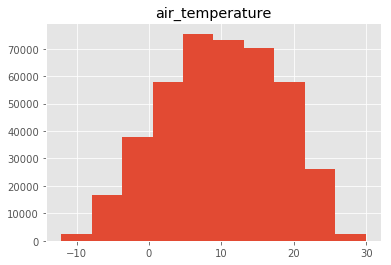

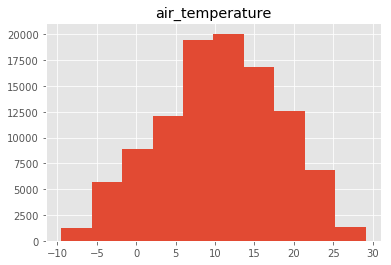

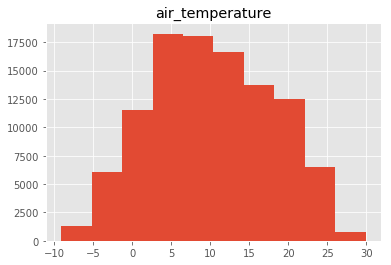

In [6]:
limited_train.hist('air_temperature')
limited_validation.hist('air_temperature')
limited_test.hist('air_temperature')

## Parse date to day of year, time to minute of day

In [7]:
DATE_FORMAT = '%Y%m%d'

for dataset in (limited_train, limited_validation, limited_test):
    dataset['LST_day_of_year'] = [datetime.strptime(str(lst_date), DATE_FORMAT).timetuple().tm_yday
                                  for lst_date in dataset.LST_date]

    dataset['LST_time_of_day'] = [lst_time if lst_time < 100 
                                  else int((lst_time % 100) + np.floor(lst_time / 100) * 60)
                                  for lst_time in dataset.LST_time]

In [37]:
X_train = limited_train.as_matrix(['LST_day_of_year', 'LST_time_of_day'])
y_train = limited_train.as_matrix(['air_temperature'])
y_train -= np.mean(y_train)
print(X_train.shape)
dim = X_train.shape[1]

(420417, 2)


In [38]:
X_validation = limited_validation.as_matrix(['LST_day_of_year', 'LST_time_of_day'])
y_validation = limited_validation.as_matrix(['air_temperature'])
y_validation -= np.mean(y_validation)
print(X_validation.shape)

(105063, 2)


## Create functions to help train, time, plot, and display models

In [39]:
TRAIN_TIME = 'Train time'
TRAIN_LL = 'Train log likelihood'
TRAIN_PREDICT_TIME = 'Train predict time'
TRAIN_MSE = 'Train MSE'
VAL_PREDICT_TIME = 'Validation predict time'
VAL_MSE = 'MSE'
VAL_MEAN ='MeanAE'
VAL_MEDIAN ='MedianAE'

RESULT_KEYS = (TRAIN_TIME, TRAIN_LL, TRAIN_PREDICT_TIME, TRAIN_MSE, 
               VAL_PREDICT_TIME, VAL_MSE, VAL_MEAN, VAL_MEDIAN)

results = defaultdict(dict)
model_names = list()  # list rather than set to maintain order

In [68]:
from sklearn import metrics
               

KEYS_TO_METRICS = {
    VAL_MSE: metrics.mean_squared_error,
    VAL_MEAN: metrics.mean_absolute_error,
    VAL_MEDIAN:metrics.median_absolute_error, 
}


def display_and_plot_model(model):
    display(model)
    fig = plt.figure(figsize=(12, 9))
    fig.gridspec = plt.GridSpec(1, 1)
#     axes = model.plot(plot_limits=np.array([1950, 2050]), figure=fig)
#     axes.set_ylim(300, 450)
    model.plot(figure=fig)
    plt.show()
    
def model_predict(model, X=X_train):
    def predict():
        # model.predict returns means and variances, we compare to means
        return model.predict(X)[0]
    
    return timeit.timeit(predict, number=1)
    

def train_and_time_model(name, kernel, Z_size=10, num_restarts=3, 
                         result_dict=results, model_name_list=model_names,
                         X=X_train, y=y_train, X_val=X_validation, y_val=y_validation):
    
    Z = np.random.rand(Z_size, 2) * [350, 1400]
    
    if name not in model_name_list:
        model_name_list.append(name)
    
    def fit_model():
        model = GPy.models.SparseGPRegression(X, y, Z=Z, kernel=kernel)
        model.optimize_restarts(messages=True, num_restarts=num_restarts)
        return model
    
    train_time, model = timeit.timeit(fit_model, number=1)
    result_dict[name][TRAIN_TIME] = train_time
    result_dict[name][TRAIN_LL] = model.log_likelihood()[0][0]
    
    train_predict_time, train_pred = model_predict(model, X_train)
    result_dict[name][TRAIN_PREDICT_TIME] = train_predict_time
    result_dict[name][TRAIN_MSE] = metrics.mean_squared_error(train_pred, y_train)
    
    val_predict_time, val_pred = model_predict(model, X_val)
    result_dict[name][VAL_PREDICT_TIME] = val_predict_time
    
    for key in KEYS_TO_METRICS:
        result_dict[name][key] = KEYS_TO_METRICS[key](val_pred, y_val)
    
    display_and_plot_model(model)
    return model


## Fit a Sparse GP 

First with a simple RBF kernel, we'll try more complicated kernels as we advance

In [41]:
rbf_kernel = GPy.kern.RBF(dim)
simple_rbf_model = train_and_time_model('Simple RBF', rbf_kernel)

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    04s31  0006   2.989947e+06   1.150188e+11 
    08s80  0012   1.559022e+06   9.361503e+07 
    12s82  0018   1.464845e+06   9.654902e+02 
    18s25  0026   1.464826e+06   1.688573e-02 
    21s00  0030   1.464826e+06   1.144083e-03 
    23s07  0033   1.464826e+06   2.723994e-02 
Runtime:     23s07
Optimization status: Converged



## Try with more inducing points, see if that helps

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    17s27  0011   1.635466e+06   3.236155e+08 
    33s43  0021   1.464830e+06   4.125378e+01 
    41s27  0026   1.464826e+06   1.689397e-02 
    53s27  0033   1.464826e+06   3.171178e-02 
Runtime:     53s27
Optimization status: Converged

Optimization restart 1/3, f = 1464826.1886485377
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    12s97  0008   2.378868e+06   2.456006e+10 
    23s06  0014   1.500744e+06   1.634859e+07 
    38s61  0023   1.464828e+06   4.323534e+00 
    51s23  0030   1.464826e+06   3.338455e-03 
    57s64  0034   1.464826e+06   1.283267e-04 
Runtime:     57s64
Optimization status: Converged

Optimization restart 2/3, f = 1464826.193347587
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    04s63  0003   1.987891e+07   1.966918e+14 
    14s18  0009   2.985950e+06   1.126935e+11 
    17s2

sparse_gp.,value,constraints,priors
inducing inputs,"(20, 2)",,
rbf.variance,4.74432014369e-07,+ve,
rbf.lengthscale,1.00849818923,+ve,
Gaussian_noise.variance,62.2164709934,+ve,


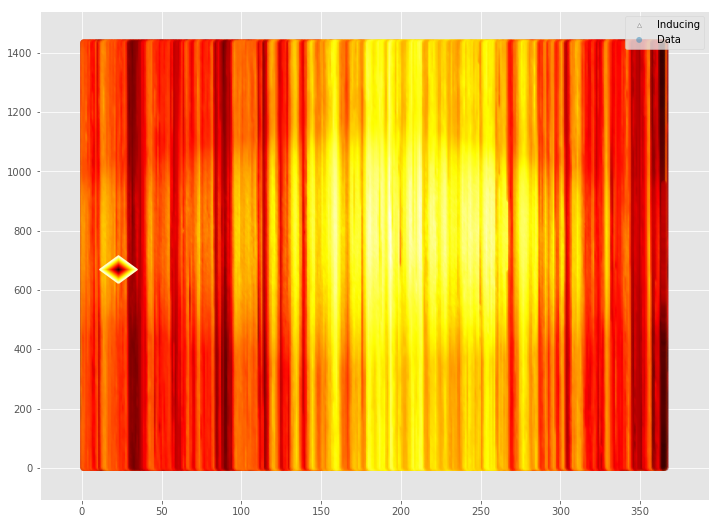

In [42]:
rbf_kernel = GPy.kern.RBF(dim)
simple_rbf_model_20_points = train_and_time_model('Simple RBF // 20 points', rbf_kernel, 20)

## More inducing points didn't really help. Let's try changing kernels

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s00  0000   1.346469e+07           nan 
    13s50  0006   2.453833e+06   3.547724e+10 
    32s79  0015   1.620100e+06   7.549473e+10 
 01m30s85  0042   1.464905e+06   1.299453e+10 
Runtime:  01m30s85
Optimization status: Converged

Optimization restart 1/3, f = 1464904.9669666586
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    04s22  0002   5.491205e+06   5.198357e+12 
    17s23  0008   1.465315e+06   2.618119e+08 
    38s34  0018   1.464889e+06   9.267727e+08 
 01m48s27  0050   1.464720e+06   4.478105e+05 
 01m54s56  0053   1.464720e+06   1.194708e+03 
Runtime:  01m54s56
Optimization status: Converged

Optimization restart 2/3, f = 1464720.1057083777
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    09s05  0004   1.769689e+06   1.923072e+22 

 /Users/guydavidson/anaconda/lib/python3.6/site-packages/paramz/transformations.py:108: RuntimeWarning:invalid value encountered in greater
 /Users/guydavidson/anaconda/lib/python3.6/site-packages/paramz/transformations.py:113: RuntimeWarning:invalid value encountered in greater



    11s69  0008   1.769689e+06   1.923072e+22 

 /Users/guydavidson/anaconda/lib/python3.6/site-packages/GPy/kern/src/standard_periodic.py:123: RuntimeWarning:overflow encountered in true_divide
 /Users/guydavidson/anaconda/lib/python3.6/site-packages/GPy/kern/src/standard_periodic.py:124: RuntimeWarning:invalid value encountered in sin


    17s03  0013   1.769689e+06   1.923072e+22 
Runtime:     17s03
Optimization status: Converged

Optimization restart 3/3, f = 1769688.8435906807
0.4263540330575779 [[-0.12996776]
 [-0.14733766]
 [-0.16403316]
 ..., 
 [-0.12491402]
 [-0.12413267]
 [-0.12227283]] 420417
(420417, 1) (420417, 1)


sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
std_periodic.variance,0.0562438855149,+ve,
std_periodic.period,1.2261586493,+ve,
std_periodic.lengthscale,1.11153903548,+ve,
Gaussian_noise.variance,62.1798259015,+ve,


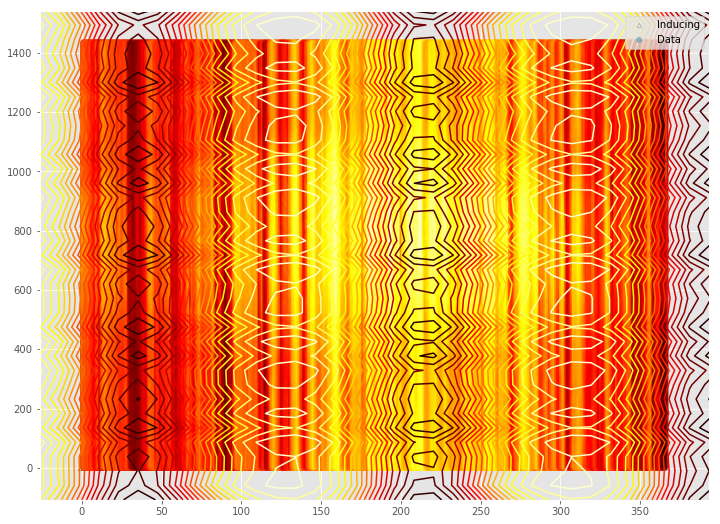

In [43]:
periodic_kernel = GPy.kern.StdPeriodic(dim)
periodic_model = train_and_time_model('Periodic', periodic_kernel)

## Periodic kernel looks better, let's try it with more points?

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    21s23  0004   5.688066e+06   3.429676e+12 
    47s81  0009   1.784862e+06   1.545541e+09 
 01m52s69  0021   1.464198e+06   5.647425e+06 
 02m03s76  0023   1.463608e+06   1.035710e+06 
 03m29s43  0039   1.463470e+06   4.873967e+03 
 04m40s30  0052   1.463448e+06   1.024704e+05 
 07m57s88  0088   1.463413e+06   5.433634e+02 
Runtime:  07m57s88
Optimization status: Converged

Optimization restart 1/3, f = 1463413.3476077542
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    16s11  0003   4.014159e+06   6.638392e+11 
    48s61  0009   2.215716e+06   1.438638e+10 
 01m26s09  0016   1.463666e+06   4.176920e+10 
 02m15s11  0025   1.464603e+06   3.383525e+07 
 03m05s49  0034   1.464232e+06   3.110237e+04 
 03m22s34  0037   1.464232e+06   4.721081e+01 
Runtime:  03m22s34
Optimization status: Converged

Optimization restart 2/3, f = 1464231.6469806035
Runni

sparse_gp.,value,constraints,priors
inducing inputs,"(20, 2)",,
std_periodic.variance,3.49832487093,+ve,
std_periodic.period,23.4670338396,+ve,
std_periodic.lengthscale,1.1208184377,+ve,
Gaussian_noise.variance,61.800310106,+ve,


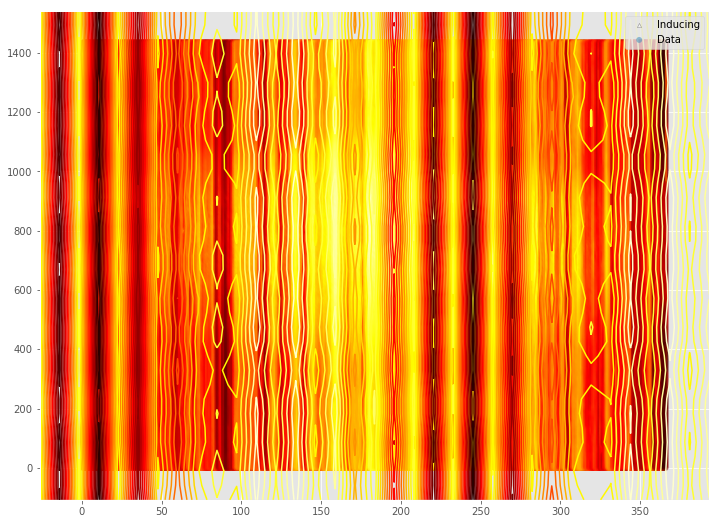

In [45]:
periodic_kernel = GPy.kern.StdPeriodic(dim)
periodic_model = train_and_time_model('Periodic // 20 points', periodic_kernel, 20)

## Let's try a combination of periodic and RBF models

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    05s97  0002   8.024051e+06   1.204698e+13 
    20s69  0007   2.483604e+06   3.466962e+10 
    35s66  0012   1.551888e+06   5.179410e+08 
    51s02  0017   1.464765e+06   6.256088e+03 
 01m26s17  0029   1.464569e+06   4.886234e+03 
 03m54s25  0080   1.463794e+06   3.083126e+03 
 07m10s90  0148   1.463770e+06   1.580662e+01 
Runtime:  07m10s90
Optimization status: Converged

Optimization restart 1/3, f = 1463769.7537433626
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    08s57  0003   9.441111e+06   2.325630e+13 
    37s87  0013   1.521594e+06   2.411286e+15 
 02m00s52  0038   1.521197e+06   6.954055e+18 
 02m40s12  0050   1.516774e+06   2.509952e+20 
 03m37s06  0071   1.521686e+06   2.509952e+20 
Runtime:  03m37s06
Optimization status: Errorb'ABNORMAL_TERMINATION_IN_LNSRCH'

Optimization restart 2/3, f = 1520301.0936610326
Running L-BFGS-B (Scipy

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,0.726851441089,+ve,
sum.std_periodic.period,0.0198805612739,+ve,
sum.std_periodic.lengthscale,0.893138199775,+ve,
sum.rbf.variance,0.388539585235,+ve,
sum.rbf.lengthscale,1.0399125675,+ve,
Gaussian_noise.variance,66.0973914183,+ve,


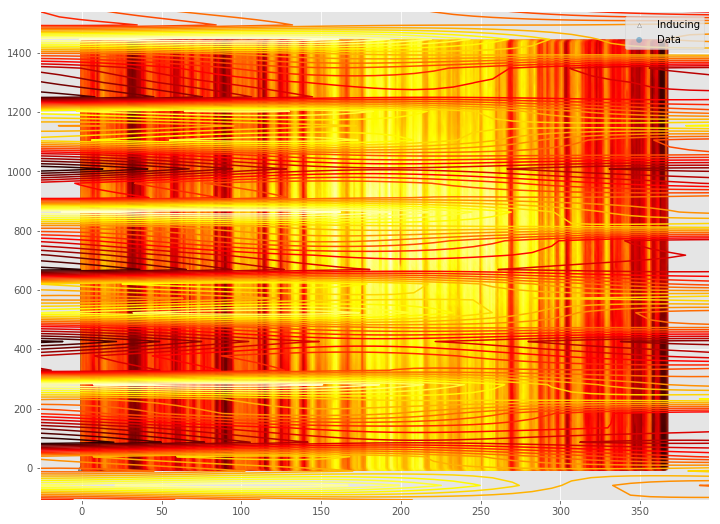

In [46]:
periodic_rbf_model = train_and_time_model('Periodic + RBF', periodic_kernel + rbf_kernel)

## Or perhaps a product of the two?

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    19s79  0007   2.486569e+06   3.714225e+10 
    43s07  0015   1.470478e+06   1.244090e+06 
    54s81  0019   1.496864e+06   7.206352e+05 
 01m20s15  0028   1.464437e+06   1.324701e+04 
 02m34s61  0054   1.464396e+06   1.078474e+03 
 06m07s15  0125   1.464288e+06   2.094836e+03 
Runtime:  06m07s15
Optimization status: Converged

Optimization restart 1/3, f = 1464288.4684582225
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    05s65  0002   8.992514e+06   1.885407e+13 
    26s77  0009   1.482509e+06   3.843982e+40 

 /Users/guydavidson/anaconda/lib/python3.6/site-packages/paramz/transformations.py:108: RuntimeWarning:invalid value encountered in greater
 /Users/guydavidson/anaconda/lib/python3.6/site-packages/paramz/transformations.py:113: RuntimeWarning:invalid value encountered in greater



    30s06  0013   1.482509e+06   3.843982e+40 

 /Users/guydavidson/anaconda/lib/python3.6/site-packages/GPy/kern/src/standard_periodic.py:123: RuntimeWarning:overflow encountered in true_divide
 /Users/guydavidson/anaconda/lib/python3.6/site-packages/GPy/kern/src/standard_periodic.py:124: RuntimeWarning:invalid value encountered in sin


    36s80  0018   1.482509e+06   3.843982e+40 
Runtime:     36s80
Optimization status: Converged

Optimization restart 2/3, f = 1482509.317199041
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    08s46  0003   4.418965e+06   9.612216e+11 
    23s26  0008   1.843407e+06   2.253938e+09 
    36s44  0012   1.498469e+06   1.249821e+08 
    55s28  0018   1.464746e+06   3.639916e+08 
 01m35s06  0031   1.464745e+06   3.181371e+04 
 01m40s69  0033   1.464745e+06   1.420503e+04 
Runtime:  01m40s69
Optimization status: Converged

Optimization restart 3/3, f = 1464744.6641914942
0.6684250819962472 [[-0.16292957]
 [-0.16967519]
 [-0.18281315]
 ..., 
 [-0.19980235]
 [-0.17006753]
 [-0.15023989]] 420417
(420417, 1) (420417, 1)


sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,7.28324153936,+ve,
sum.std_periodic.period,28.4801509931,+ve,
sum.std_periodic.lengthscale,2.76229196901,+ve,
sum.rbf.variance,7.74584002513e-08,+ve,
sum.rbf.lengthscale,1.00811472611,+ve,
Gaussian_noise.variance,62.0051691727,+ve,


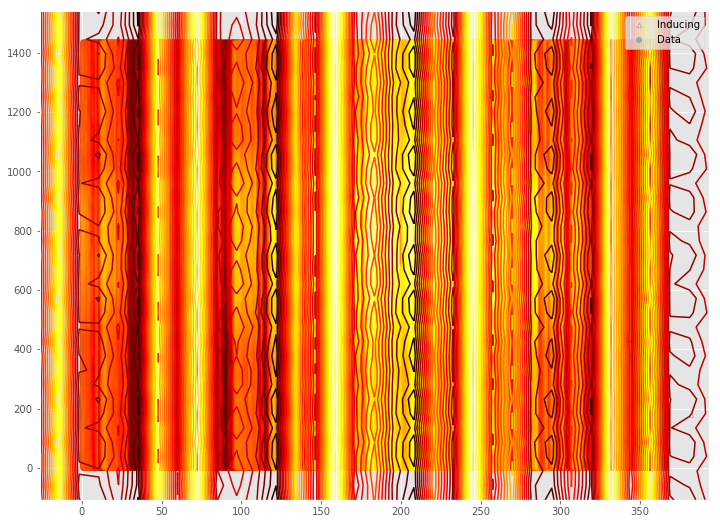

In [47]:
prod_periodic_rbf_model = train_and_time_model('Periodic x RBF', periodic_kernel + rbf_kernel)

## Perhaps a fairly more complicated kernel, akin to the Mauna Loa one

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
 01m21s34  0013   1.514400e+06   2.805926e+07 
 01m46s42  0017   1.465106e+06   2.826126e+04 
 01m59s23  0019   1.464856e+06   2.613190e+02 
 03m04s07  0030   1.464826e+06   4.561287e-02 
 03m32s50  0035   1.464826e+06   9.425514e-03 
Runtime:  03m32s50
Optimization status: Converged

Optimization restart 1/3, f = 1464826.1892905387
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    29s45  0005   5.297643e+06   2.052196e+12 
    53s09  0009   2.325181e+06   1.903762e+10 
 01m27s24  0015   1.494497e+06   1.183949e+07 
 01m48s69  0019   1.464904e+06   4.518803e+03 
 02m16s43  0024   1.464830e+06   6.542959e+00 
 03m05s98  0033   1.464826e+06   5.935971e-03 
 03m28s86  0037   1.464826e+06   5.498105e-03 
Runtime:  03m28s86
Optimization status: Converged

Optimization restart 2/3, f = 1464826.1906415196
Running L-BFGS-B (Scipy implementation) Code:
  runt

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.rbf.variance,3.32819006169e-07,+ve,
sum.rbf.lengthscale,0.154658480975,+ve,
sum.mul.rbf.variance,0.000626012430319,+ve,
sum.mul.rbf.lengthscale,0.831956263963,+ve,
sum.mul.std_periodic.variance,0.000294564894662,+ve,
sum.mul.std_periodic.period,1.57852333931,+ve,
sum.mul.std_periodic.lengthscale,0.788461815286,+ve,
sum.RatQuad.variance,4.56060096675e-07,+ve,
sum.RatQuad.lengthscale,0.831166235985,+ve,


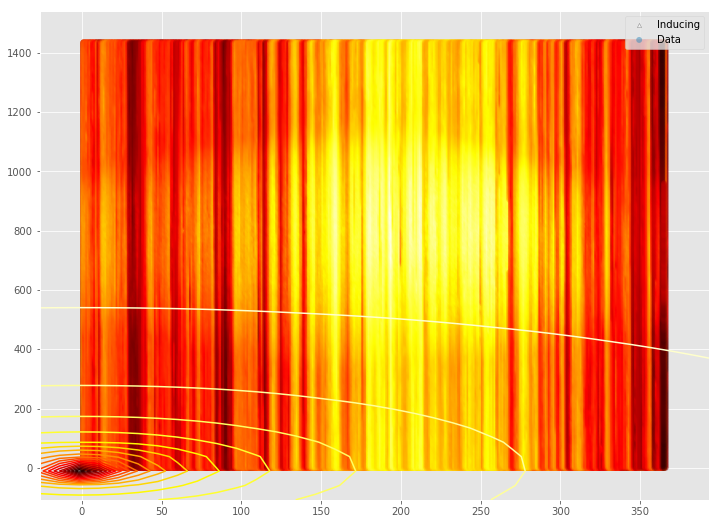

In [48]:
k1 = GPy.kern.RBF(dim)  
k2 = GPy.kern.RBF(dim) * GPy.kern.StdPeriodic(dim) 
k3 = GPy.kern.RatQuad(dim) 
k4 = GPy.kern.White(dim)
kernel_gpml = k1 + k2 + k3 + k4

complicated_model = train_and_time_model('Complicated', kernel=kernel_gpml)

## Perhaps a sum of periodic kernels, since the periodic works so well?

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    21s09  0005   1.292210e+07   8.313493e+14 
 01m07s58  0016   1.140649e+07   2.656459e+19 
 02m01s26  0029   1.006246e+07   1.288461e+18 
 02m30s39  0036   1.589978e+06   3.555286e+17 
 03m17s51  0047   1.465039e+06   1.369110e+11 
 03m30s30  0050   1.464967e+06   1.016638e+10 
 03m52s00  0055   1.464965e+06   3.651693e+05 
Runtime:  03m52s00
Optimization status: Converged

Optimization restart 1/3, f = 1464965.3645604702
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    08s58  0002   1.519073e+07   1.068811e+14 
    42s70  0010   2.409574e+06   2.957305e+12 
 01m29s32  0021   1.485386e+06   9.150411e+11 
 02m11s31  0031   1.463934e+06   2.851672e+07 
 02m57s58  0042   1.463915e+06   1.604552e+07 
 03m35s34  0051   1.463905e+06   2.652636e+05 
Runtime:  03m35s34
Optimization status: Converged

Optimization restart 2/3, f = 1463905.2721583412
Runni

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,0.237482351542,+ve,
sum.std_periodic.period,0.905122446518,+ve,
sum.std_periodic.lengthscale,2.06271156323,+ve,
sum.std_periodic_1.variance,0.0569844952594,+ve,
sum.std_periodic_1.period,5.42152707911,+ve,
sum.std_periodic_1.lengthscale,0.935664469598,+ve,
Gaussian_noise.variance,62.0065523478,+ve,


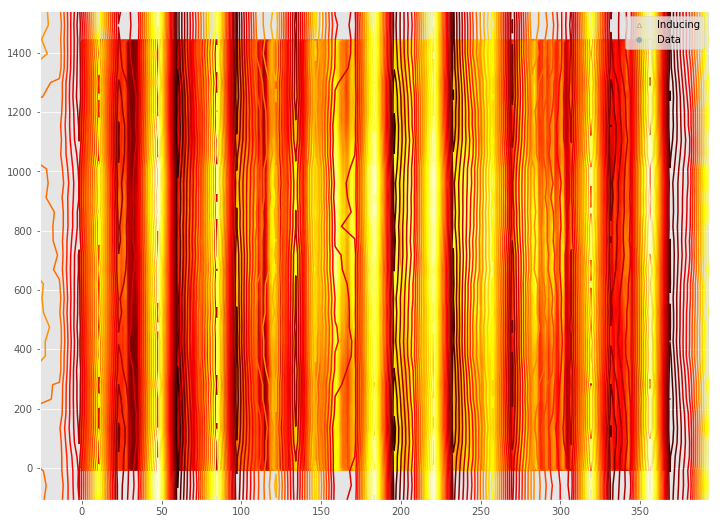

In [49]:
two_periodic_model = train_and_time_model('Two Periodics', 
                                          GPy.kern.StdPeriodic(dim) + \
                                          GPy.kern.StdPeriodic(dim, variance=10, lengthscale=10, period=10))

## Or a single periodic, with different initial conditions for the parameters

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    06s27  0003   5.220214e+06   2.177341e+12 
    23s48  0011   1.557961e+06   6.962232e+13 
    33s67  0015   1.470282e+06   1.254032e+12 
 01m44s68  0044   1.468302e+06   1.059285e+17 
 05m01s02  0125   1.296995e+06   6.149284e+16 
 09m51s44  0250   1.296241e+06   2.289787e+13 
Runtime:  09m51s44
Optimization status: Converged

Optimization restart 1/3, f = 1296241.3859804068
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    06s08  0003   4.866172e+06   6.223894e+12 
    22s35  0011   2.678341e+06   1.551911e+15 
 01m06s55  0033   1.462121e+06   3.354913e+16 
 02m35s69  0078   1.455962e+06   1.122486e+11 
 02m41s56  0081   1.455962e+06   1.279460e+09 
Runtime:  02m41s56
Optimization status: Converged

Optimization restart 2/3, f = 1455962.1035605457
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    16s

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
std_periodic.variance,9.98041834383,+ve,
std_periodic.period,0.000904974774954,+ve,
std_periodic.lengthscale,10.0774927981,+ve,
Gaussian_noise.variance,36.7090825997,+ve,


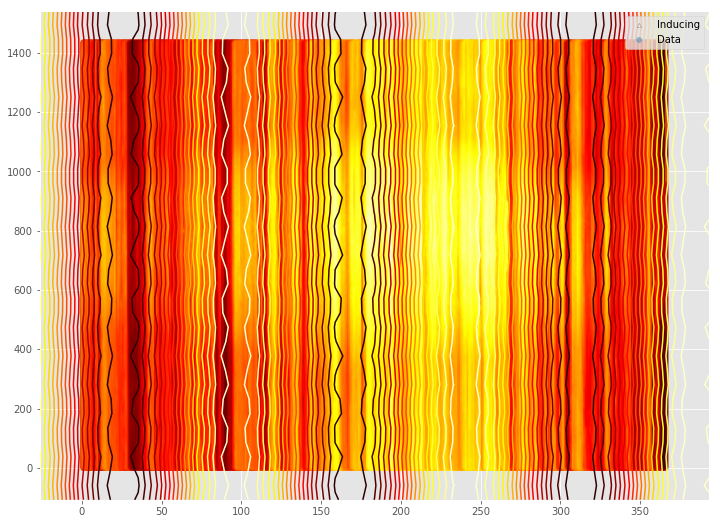

In [58]:
diff_periodic = train_and_time_model('Different Periodic', 
                                          GPy.kern.StdPeriodic(dim, variance=10, lengthscale=10, period=10))

## Print summary table of results

In [57]:
header = ['Metric'] + model_names
table = [[key] + [results[model][key] for model in model_names] for key in RESULT_KEYS]

print(tabulate.tabulate(table, header, tablefmt='html'))

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  Simple RBF // 20 points</th><th style="text-align: right;">     Periodic</th><th style="text-align: right;">  Periodic // 20 points</th><th style="text-align: right;">  Periodic + RBF</th><th style="text-align: right;">  Periodic x RBF</th><th style="text-align: right;">  Complicated</th><th style="text-align: right;">  Two Periodics</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">            179.717      </td><td style="text-align: right;">238.209      </td><td style="text-align: right;">         1089.55       </td><td style="text-align: right;">   851.051      </td><td style="text-align: right;">   525.182      </td><td style="text-align: right;">660.451      </td><td style="text-align: right;"> 1553.94       </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;">             -1.46483e+06</td><td style="text-align: right;"> -1.46472

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  Simple RBF // 20 points</th><th style="text-align: right;">     Periodic</th><th style="text-align: right;">  Periodic // 20 points</th><th style="text-align: right;">  Periodic + RBF</th><th style="text-align: right;">  Periodic x RBF</th><th style="text-align: right;">  Complicated</th><th style="text-align: right;">  Two Periodics</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">            179.717      </td><td style="text-align: right;">238.209      </td><td style="text-align: right;">         1089.55       </td><td style="text-align: right;">   851.051      </td><td style="text-align: right;">   525.182      </td><td style="text-align: right;">660.451      </td><td style="text-align: right;"> 1553.94       </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;">             -1.46483e+06</td><td style="text-align: right;"> -1.46472e+06</td><td style="text-align: right;">           -1.46341e+06</td><td style="text-align: right;">    -1.46227e+06</td><td style="text-align: right;">    -1.46429e+06</td><td style="text-align: right;"> -1.46483e+06</td><td style="text-align: right;">   -1.46391e+06</td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">              0.444586   </td><td style="text-align: right;">  0.426354   </td><td style="text-align: right;">            1.1472     </td><td style="text-align: right;">     0.645425   </td><td style="text-align: right;">     0.668425   </td><td style="text-align: right;">  1.15111    </td><td style="text-align: right;">    0.826235   </td></tr>
<tr><td>Train MSE              </td><td style="text-align: right;">             62.2132     </td><td style="text-align: right;"> 62.1743     </td><td style="text-align: right;">           61.7584     </td><td style="text-align: right;">    60.4676     </td><td style="text-align: right;">    62.027      </td><td style="text-align: right;"> 62.2132     </td><td style="text-align: right;">   61.9132     </td></tr>
<tr><td>Validation predict time</td><td style="text-align: right;">              0.10399    </td><td style="text-align: right;">  0.110728   </td><td style="text-align: right;">            0.248054   </td><td style="text-align: right;">     0.172234   </td><td style="text-align: right;">     0.18512    </td><td style="text-align: right;">  0.303316   </td><td style="text-align: right;">    0.229346   </td></tr>
<tr><td>MSE                    </td><td style="text-align: right;">             57.0997     </td><td style="text-align: right;"> 57.1362     </td><td style="text-align: right;">           56.8642     </td><td style="text-align: right;">    55.1338     </td><td style="text-align: right;">    57.8444     </td><td style="text-align: right;"> 57.0997     </td><td style="text-align: right;">   56.838      </td></tr>
<tr><td>MeanAE                 </td><td style="text-align: right;">              6.14151    </td><td style="text-align: right;">  6.14993    </td><td style="text-align: right;">            6.11645    </td><td style="text-align: right;">     6.02809    </td><td style="text-align: right;">     6.15861    </td><td style="text-align: right;">  6.14151    </td><td style="text-align: right;">    6.12901    </td></tr>
<tr><td>MedianAE               </td><td style="text-align: right;">              5.38143    </td><td style="text-align: right;">  5.3913     </td><td style="text-align: right;">            5.43996    </td><td style="text-align: right;">     5.33962    </td><td style="text-align: right;">     5.34023    </td><td style="text-align: right;">  5.38143    </td><td style="text-align: right;">    5.37859    </td></tr>
</tbody>
</table>

## Discussion

Technical notes:
* All models were Sparse GP models.
* Each model uses a different covariance function, but without any optimization of the hyperparemters, beyond as performed by the optimization routine. See bullet 3. The covariance functions include a simple RBF, a periodic function (sinusodial), a sum of periodic and RBF, a product, a different linear combination of kernels (RBF + RBF x periodic + Rational Quadratic + white noise), and a sum of two periodics.
* Other than two models run with 20 inducing points, all models were ran with 10 inducing points, sampled uniformly from the range of the data (day of year up to 365, time of day up to 1440).
* All models were affored three restarts of the optimization procedure.

Several interesting observations from this exercise:
1. This training regime is probably rather inefficient. I'm fairly sure we could extract out a smaller subset of samples to use in training and not lose all that much in performance. It would be interesting to quantify it by fitting the same models on increasingly large subsamples of the training set and observing the performance.
2. The optimization procedure doesn't appear to reinitialize the hyperparameter values beyond their initially assigned values - in other words, every initialization of the optimization appears to search locally around the same initial parameters. Another intersting exercises would be to create the same type of model, sampling initial kernel hyperparameters (akin to how Sklearn's hyperparameter searches work), and fitting a GP for each. 
3. The results, without further optimization, appear substantially outperformed by the LPM. The LPM achieves an MSE of under half the best GP fit, with much far faster fit and prediction times. Sad.

### See limited investigations of 1 and 2 below

For reference, my LPM model from last week achieved the following results: 
* Cross-validation time (on the 2011-2014 data): 3.1 seconds
* Fit time (best cross-validated choice on 2011-2014 data): 0.35 seconds
* Prediction time (validation set, 2015 data): 0.025 seconds
* Validation set MSE: 25.57
* Validation MAE (mean absolute error): 4.21
* Validation median absolute error: 3.84

## Examining at the effect of the size of the training set:

Using the sum of periodic + RBF kernels, which appeared best (by a slight margin) above

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    02s27  0006   4.948521e+05   3.121832e+09 
    04s71  0012   2.580370e+05   1.966225e+06 
    07s11  0018   2.443215e+05   3.597961e+03 
    22s96  0057   2.442854e+05   1.837195e+03 
 01m04s74  0155   2.442821e+05   4.823236e-01 
Runtime:  01m04s74
Optimization status: Converged

Optimization restart 1/3, f = 244282.0932458285
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    02s62  0006   9.842921e+05   1.029973e+12 
    03s84  0009   4.106556e+05   1.079893e+12 
    10s37  0024   2.445392e+05   1.156051e+07 
    11s74  0027   2.445465e+05   1.500662e+08 
    17s78  0042   2.443967e+05   1.890137e+08 
    29s06  0069   2.442658e+05   4.816233e+06 
    30s70  0073   2.442658e+05   4.624683e+03 
Runtime:     30s70
Optimization status: Converged

Optimization restart 2/3, f = 244265.80632454043
Running L-BFGS-B (Scipy implementation) Code:
  runti

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,2.50310550153,+ve,
sum.std_periodic.period,1.99368122788,+ve,
sum.std_periodic.lengthscale,0.804328865917,+ve,
sum.rbf.variance,0.0491142926537,+ve,
sum.rbf.lengthscale,0.246578241165,+ve,
Gaussian_noise.variance,29.0159394354,+ve,


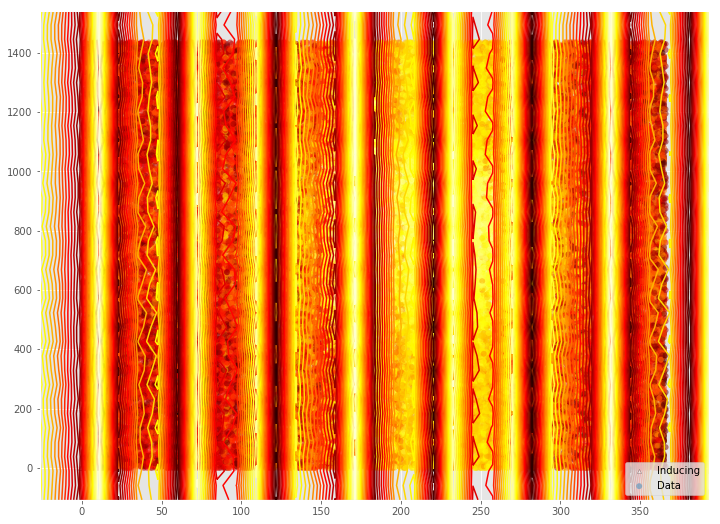

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    01s66  0002   2.669677e+06   1.332916e+12 
    05s06  0006   9.833443e+05   1.227213e+10 
    06s76  0008   7.126971e+05   1.162513e+09 
    11s77  0014   4.932330e+05   5.394465e+05 
    16s92  0020   4.881166e+05   3.694086e+03 
    26s63  0031   4.881091e+05   1.583651e+02 
    38s54  0045   4.880976e+05   5.793306e+01 
    40s19  0047   4.880976e+05   7.553413e+01 
Runtime:     40s19
Optimization status: Converged

Optimization restart 1/3, f = 488097.5998831755
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    06s63  0008   6.958464e+05   8.163110e+11 
    15s10  0018   4.881982e+05   1.375561e+04 
    20s39  0024   4.881855e+05   7.581976e+04 
    34s38  0040   4.881800e+05   6.968542e+01 
Runtime:     34s38
Optimization status: Converged

Optimization restart 2/3, f = 488180.0302998518
Running L-BFGS-B (Scipy implementation) Code:
  runtim

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,3.39080810277,+ve,
sum.std_periodic.period,24.8622080117,+ve,
sum.std_periodic.lengthscale,2.09546819013,+ve,
sum.rbf.variance,4.66941545704e-07,+ve,
sum.rbf.lengthscale,1.00848219466,+ve,
Gaussian_noise.variance,62.0266286521,+ve,


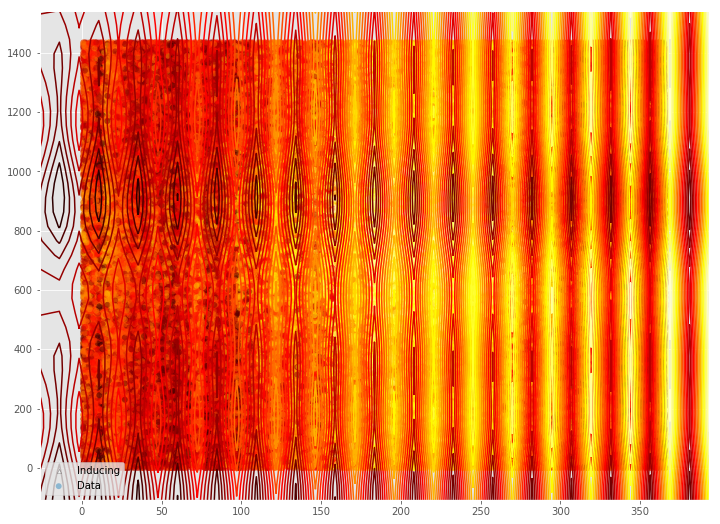

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    08s87  0007   1.242825e+06   8.693400e+09 
    18s83  0015   7.343020e+05   9.250280e+05 
    24s88  0020   7.321181e+05   4.637964e+03 
    56s95  0046   7.318307e+05   6.248731e+02 
 01m43s69  0084   7.318225e+05   2.899717e+01 
 02m48s46  0137   7.318186e+05   3.742711e+00 
Runtime:  02m48s46
Optimization status: Converged

Optimization restart 1/3, f = 731818.6296465587
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    03s69  0003   4.722184e+06   1.876269e+13 
    13s58  0011   8.040522e+05   5.571108e+07 
    20s99  0017   7.323311e+05   6.964205e+04 
    30s75  0025   7.319826e+05   3.729748e+05 
    34s38  0028   7.319409e+05   7.797607e+03 
 01m11s59  0058   7.318333e+05   2.489120e+02 
 02m12s08  0105   7.318236e+05   1.293927e+02 
 03m37s28  0170   7.318216e+05   3.491768e+00 
Runtime:  03m37s28
Optimization status: Converged

Optimiza

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,9.87922492498,+ve,
sum.std_periodic.period,27.2271227041,+ve,
sum.std_periodic.lengthscale,2.33499046371,+ve,
sum.rbf.variance,3.95106361905e-07,+ve,
sum.rbf.lengthscale,1.00855563528,+ve,
Gaussian_noise.variance,61.8360626776,+ve,


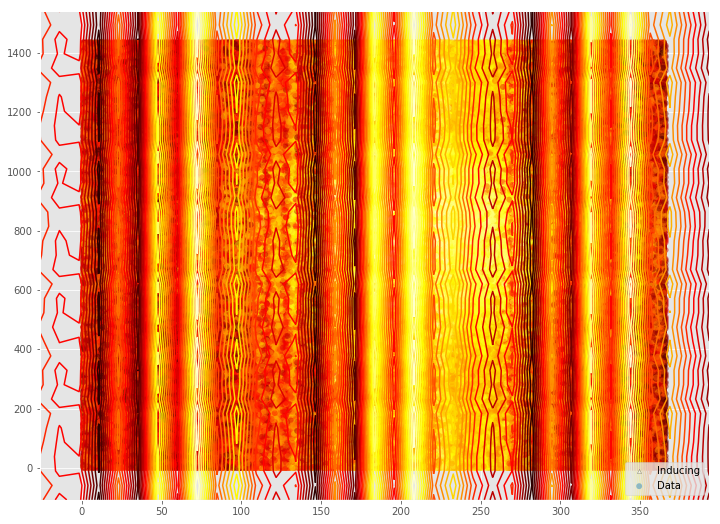

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    14s64  0008   1.432944e+06   4.876154e+09 
    26s90  0015   9.786801e+05   4.243872e+05 
    44s23  0024   9.757689e+05   1.188141e+08 
 01m24s47  0046   9.755896e+05   2.214674e+04 
 01m47s32  0059   9.755743e+05   3.624601e+02 
 04m39s60  0151   9.755402e+05   1.124329e+02 
 04m45s38  0154   9.755402e+05   5.090670e+00 
Runtime:  04m45s38
Optimization status: Converged

Optimization restart 1/3, f = 975540.2285440204
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    15s06  0008   1.682361e+06   5.442009e+12 
    28s26  0015   9.782149e+05   6.097430e+05 
    32s00  0017   9.763087e+05   2.881098e+06 
    39s91  0021   9.762290e+05   2.989337e+04 
    43s83  0023   9.762279e+05   2.258813e+02 
    58s33  0030   9.762160e+05   5.939816e+03 
 01m25s49  0044   9.762115e+05   4.885525e+01 
 01m31s17  0047   9.762115e+05   9.944319e-01 
Runtime:  01

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,0.558635831443,+ve,
sum.std_periodic.period,0.217360652312,+ve,
sum.std_periodic.lengthscale,0.629909904513,+ve,
sum.rbf.variance,0.392584431179,+ve,
sum.rbf.lengthscale,0.779533085312,+ve,
Gaussian_noise.variance,58.0244129478,+ve,


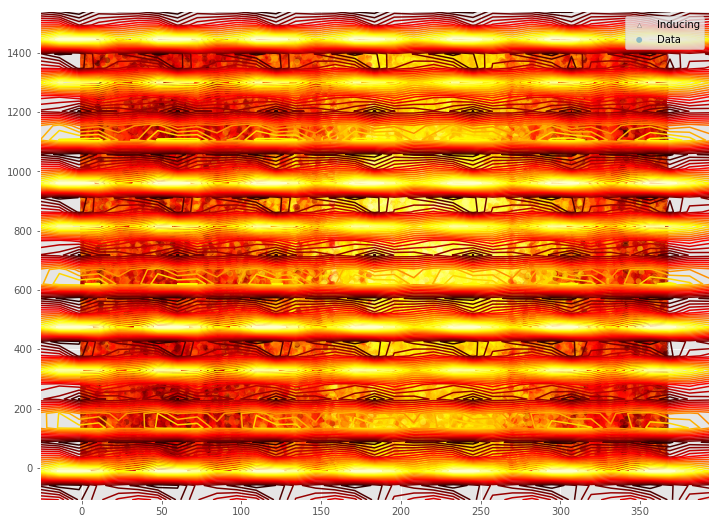

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    04s56  0002   6.686276e+06   8.372193e+12 
    18s22  0008   1.778131e+06   7.037280e+09 
    31s87  0014   1.234303e+06   3.674820e+06 
    34s14  0015   1.224683e+06   1.390093e+06 
    56s80  0025   1.219842e+06   9.158154e+09 
 01m06s11  0029   1.219942e+06   2.936356e+03 
 01m18s57  0034   1.219933e+06   6.072695e+00 
 02m06s97  0054   1.219931e+06   4.270175e-01 
Runtime:  02m06s97
Optimization status: Converged

Optimization restart 1/3, f = 1219931.2147883421
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    04s74  0002   3.789998e+06   5.996887e+13 
    18s92  0008   3.732188e+06   7.220900e+11 
    59s83  0025   1.220920e+06   1.405077e+05 
 02m07s93  0054   1.220576e+06   1.206515e+05 
Runtime:  02m07s93
Optimization status: Converged

Optimization restart 2/3, f = 1220576.1754380693
Running L-BFGS-B (Scipy implementation) Code:
  runt

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,7.95471582856,+ve,
sum.std_periodic.period,9.5392994383,+ve,
sum.std_periodic.lengthscale,6.01166417765,+ve,
sum.rbf.variance,4.55311281579e-07,+ve,
sum.rbf.lengthscale,1.00852347893,+ve,
Gaussian_noise.variance,61.9407030739,+ve,


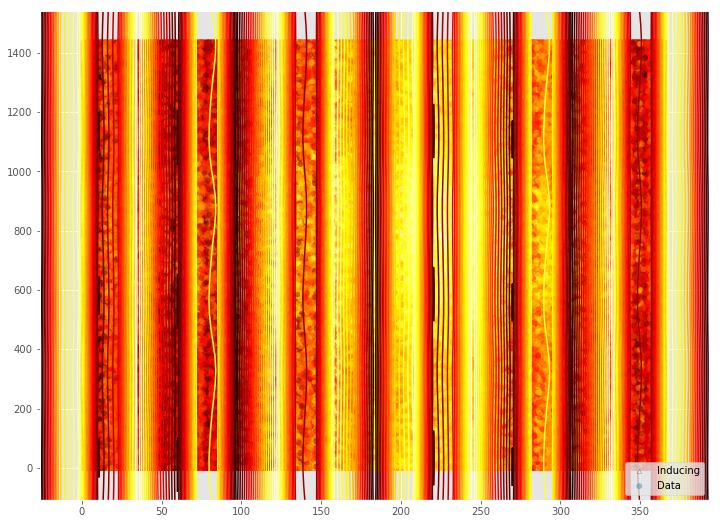

ValueError: train_size=1.000000 should be smaller than 1.0 or be an integer

In [75]:
from sklearn.model_selection import train_test_split

NUM_SPLITS = 6

train_set_results = defaultdict(dict)
train_set_model_names = []

for i in range(NUM_SPLITS):
    train_size = (i + 1.0) / NUM_SPLITS
    X_train_small, _, y_train_small, _ = train_test_split(X_train, y_train, test_size=0, 
                                                       train_size=train_size)

    train_and_time_model('{t:.2f}% of data'.format(t=train_size), 
                         periodic_kernel + rbf_kernel,
                         num_restarts=3, result_dict=train_set_results, 
                         model_name_list=train_set_model_names,
                         X=X_train_small, y=y_train_small)

In [76]:
header = ['Metric'] + train_set_model_names
table = [[key] + [train_set_results[model][key] for model in train_set_results] for key in RESULT_KEYS]

print(tabulate.tabulate(table, header, tablefmt='html'))

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  0.17% of data</th><th style="text-align: right;">  0.33% of data</th><th style="text-align: right;">  0.50% of data</th><th style="text-align: right;">  0.67% of data</th><th style="text-align: right;">  0.83% of data</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">     502.192   </td><td style="text-align: right;">     124.668   </td><td style="text-align: right;">     481.343   </td><td style="text-align: right;">     452.246   </td><td style="text-align: right;">  351.267      </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;"> -215943       </td><td style="text-align: right;"> -488098       </td><td style="text-align: right;"> -731819       </td><td style="text-align: right;"> -972623       </td><td style="text-align: right;">   -1.21993e+06</td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">       0.

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  0.17% of data</th><th style="text-align: right;">  0.33% of data</th><th style="text-align: right;">  0.50% of data</th><th style="text-align: right;">  0.67% of data</th><th style="text-align: right;">  0.83% of data</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">     502.192   </td><td style="text-align: right;">     124.668   </td><td style="text-align: right;">     481.343   </td><td style="text-align: right;">     452.246   </td><td style="text-align: right;">  351.267      </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;"> -215943       </td><td style="text-align: right;"> -488098       </td><td style="text-align: right;"> -731819       </td><td style="text-align: right;"> -972623       </td><td style="text-align: right;">   -1.21993e+06</td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">       0.678716</td><td style="text-align: right;">       0.747536</td><td style="text-align: right;">       0.739104</td><td style="text-align: right;">       0.686118</td><td style="text-align: right;">    0.689748   </td></tr>
<tr><td>Train MSE              </td><td style="text-align: right;">      26.5268  </td><td style="text-align: right;">      62.0927  </td><td style="text-align: right;">      61.8732  </td><td style="text-align: right;">      59.842   </td><td style="text-align: right;">   61.9477     </td></tr>
<tr><td>Validation predict time</td><td style="text-align: right;">       0.151085</td><td style="text-align: right;">       0.159258</td><td style="text-align: right;">       0.182543</td><td style="text-align: right;">       0.171927</td><td style="text-align: right;">    0.174155   </td></tr>
<tr><td>MSE                    </td><td style="text-align: right;">      28.5383  </td><td style="text-align: right;">      57.0923  </td><td style="text-align: right;">      57.1093  </td><td style="text-align: right;">      54.4285  </td><td style="text-align: right;">   56.8006     </td></tr>
<tr><td>MeanAE                 </td><td style="text-align: right;">       4.3864  </td><td style="text-align: right;">       6.13476 </td><td style="text-align: right;">       6.15504 </td><td style="text-align: right;">       5.99177 </td><td style="text-align: right;">    6.11983    </td></tr>
<tr><td>MedianAE               </td><td style="text-align: right;">       3.91043 </td><td style="text-align: right;">       5.34313 </td><td style="text-align: right;">       5.40607 </td><td style="text-align: right;">       5.31866 </td><td style="text-align: right;">    5.3705     </td></tr>
</tbody>
</table>

Fascinatingly, there appears to be a huge sweet-spot at around a third of the data, and as a whole, the results seem fairly odd. There's also something very weird going on with the smallest model - it is showing by a wide margin the best validation set MSE, almost on the par of the LPM models. 

It appears that either I've made a mistake, or the (sparse) GPs are overfitting the data, if provided too much of it? That makes very little sense to me. Let's add a few more models with little data below:

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s19  0002   3.190540e+05   1.902367e+10 
    01s20  0016   5.855367e+04   6.346990e+02 
    05s48  0069   5.854004e+04   3.127722e+01 
    10s73  0132   5.853931e+04   7.722370e+00 
    17s94  0230   5.853897e+04   1.335490e-01 
    19s96  0258   5.853895e+04   1.747663e-03 
Runtime:     19s96
Optimization status: Converged

Optimization restart 1/3, f = 58538.94968063961
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s16  0002   1.960466e+06   2.913548e+12 
    01s24  0016   6.092484e+04   1.212747e+16 
    02s63  0036   5.859806e+04   3.824661e+12 

 /Users/guydavidson/anaconda/lib/python3.6/site-packages/paramz/transformations.py:108: RuntimeWarning:invalid value encountered in greater
 /Users/guydavidson/anaconda/lib/python3.6/site-packages/paramz/transformations.py:113: RuntimeWarning:invalid value encountered in greater



Runtime:     02s63
Optimization status: Converged

Optimization restart 2/3, f = 58598.058424183066
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s00  0000   1.134483e+06   3.824661e+12 
    01s21  0015   5.884550e+04   3.406104e+07 
    03s25  0043   5.857887e+04   1.113652e+10 
    04s06  0054   5.857609e+04   3.944849e+03 
Runtime:     04s06
Optimization status: Converged

Optimization restart 3/3, f = 58576.08737241407


sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,0.525999446794,+ve,
sum.std_periodic.period,27.3038090312,+ve,
sum.std_periodic.lengthscale,0.882863325982,+ve,
sum.rbf.variance,3.9887485637e-07,+ve,
sum.rbf.lengthscale,1.00857255483,+ve,
Gaussian_noise.variance,61.7334387462,+ve,


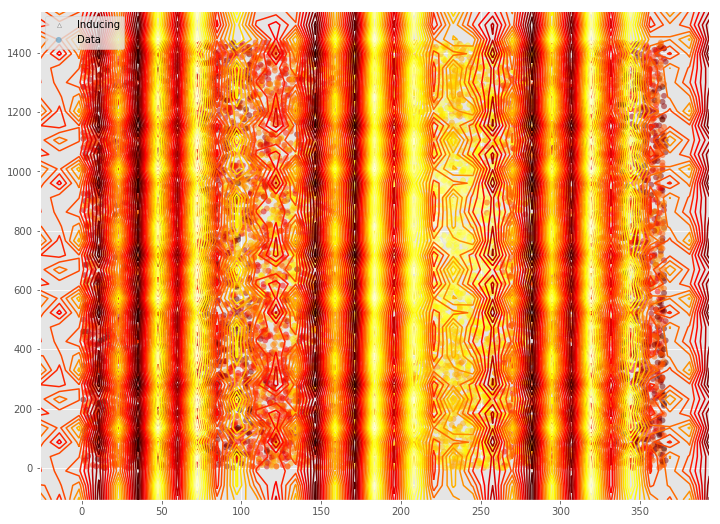

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    01s06  0006   2.373637e+05   7.152642e+08 
    02s12  0012   1.246127e+05   5.574034e+05 
    04s31  0024   1.172780e+05   1.194139e-01 
    15s26  0082   1.172736e+05   3.876778e+00 
    20s79  0112   1.172713e+05   8.003100e+00 
    39s55  0213   1.172701e+05   7.229102e-02 
    41s34  0223   1.172701e+05   5.053592e-03 
Runtime:     41s34
Optimization status: Converged

Optimization restart 1/3, f = 117270.11589133673
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s17  0001   4.679716e+06   2.595830e+13 
    03s39  0019   1.173128e+05   1.891843e+06 
    13s37  0069   1.172896e+05   1.039792e+04 
    14s85  0077   1.172896e+05   4.005630e+01 
Runtime:     14s85
Optimization status: Converged

Optimization restart 2/3, f = 117289.63837396134
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,0.562420261278,+ve,
sum.std_periodic.period,37.4095712872,+ve,
sum.std_periodic.lengthscale,0.94034319312,+ve,
sum.rbf.variance,2.99433294834e-07,+ve,
sum.rbf.lengthscale,1.00830753735,+ve,
Gaussian_noise.variance,62.4655576977,+ve,


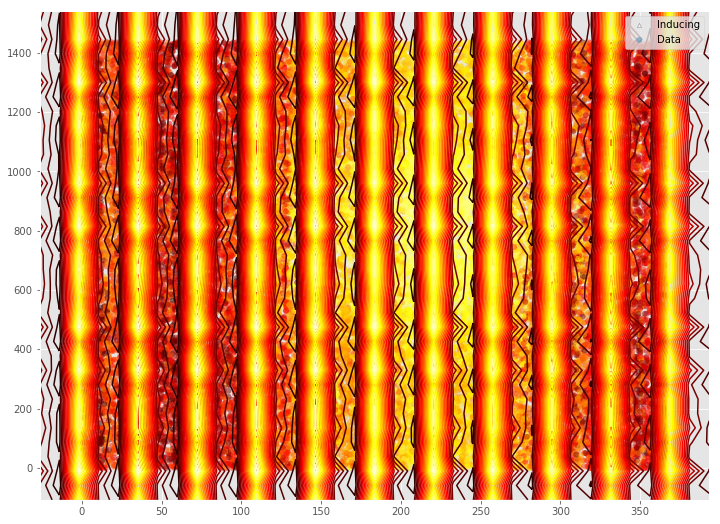

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    03s28  0012   1.856159e+05   1.132468e+06 
    08s75  0032   1.755374e+05   1.938361e+03 
    14s26  0052   1.755336e+05   6.759487e+03 
    42s70  0152   1.755252e+05   2.978628e-01 
    54s71  0195   1.755249e+05   3.667088e-01 
Runtime:     54s71
Optimization status: Converged

Optimization restart 1/3, f = 175524.88416708543
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    01s11  0004   4.338662e+05   6.170830e+09 
    03s31  0012   2.267247e+05   7.293871e+07 
    04s43  0016   1.779540e+05   2.247368e+05 
    08s87  0032   1.755798e+05   8.930309e+03 
    27s29  0100   1.755768e+05   1.292241e+02 
    31s12  0114   1.755766e+05   1.909921e-01 
Runtime:     31s12
Optimization status: Converged

Optimization restart 2/3, f = 175576.55239414677
Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    00s

sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
sum.std_periodic.variance,4.14560493572,+ve,
sum.std_periodic.period,2.00636673386,+ve,
sum.std_periodic.lengthscale,0.945024157917,+ve,
sum.rbf.variance,0.00971863117252,+ve,
sum.rbf.lengthscale,1.1572791837,+ve,
Gaussian_noise.variance,27.2633927429,+ve,


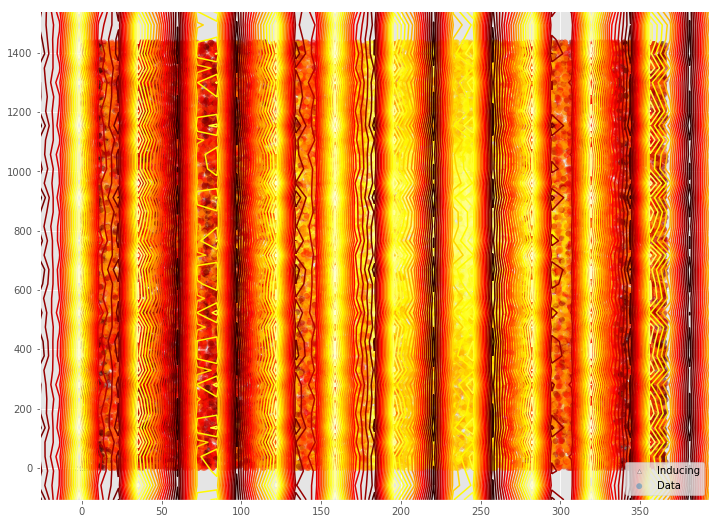

In [77]:
NUM_SPLITS = 3

train_set_results = defaultdict(dict)
train_set_model_names = []

for i in range(NUM_SPLITS):
    train_size = (i + 1.0) * 0.04
    X_train_small, _, y_train_small, _ = train_test_split(X_train, y_train, test_size=0, 
                                                       train_size=train_size)

    train_and_time_model('{t:.2f}% of data'.format(t=train_size), 
                         periodic_kernel + rbf_kernel,
                         num_restarts=3, result_dict=train_set_results, 
                         model_name_list=train_set_model_names,
                         X=X_train_small, y=y_train_small)

In [78]:
header = ['Metric'] + train_set_model_names
table = [[key] + [train_set_results[model][key] for model in train_set_results] for key in RESULT_KEYS]

print(tabulate.tabulate(table, header, tablefmt='html'))

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  0.04% of data</th><th style="text-align: right;">  0.08% of data</th><th style="text-align: right;">  0.12% of data</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">      27.2267  </td><td style="text-align: right;">      70.8674  </td><td style="text-align: right;">     364.123   </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;">  -58538.9     </td><td style="text-align: right;"> -117270       </td><td style="text-align: right;"> -155442       </td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">       0.722787</td><td style="text-align: right;">       0.679819</td><td style="text-align: right;">       0.686966</td></tr>
<tr><td>Train MSE              </td><td style="text-align: right;">      61.9257  </td><td style="text-align: right;">      61.9652  </td><td style="text-align: right;">      26.8498  </t

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  0.04% of data</th><th style="text-align: right;">  0.08% of data</th><th style="text-align: right;">  0.12% of data</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">      27.2267  </td><td style="text-align: right;">      70.8674  </td><td style="text-align: right;">     364.123   </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;">  -58538.9     </td><td style="text-align: right;"> -117270       </td><td style="text-align: right;"> -155442       </td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">       0.722787</td><td style="text-align: right;">       0.679819</td><td style="text-align: right;">       0.686966</td></tr>
<tr><td>Train MSE              </td><td style="text-align: right;">      61.9257  </td><td style="text-align: right;">      61.9652  </td><td style="text-align: right;">      26.8498  </td></tr>
<tr><td>Validation predict time</td><td style="text-align: right;">       0.148708</td><td style="text-align: right;">       0.157527</td><td style="text-align: right;">       0.157085</td></tr>
<tr><td>MSE                    </td><td style="text-align: right;">      56.9898  </td><td style="text-align: right;">      56.755   </td><td style="text-align: right;">      28.7211  </td></tr>
<tr><td>MeanAE                 </td><td style="text-align: right;">       6.1471  </td><td style="text-align: right;">       6.13379 </td><td style="text-align: right;">       4.40118 </td></tr>
<tr><td>MedianAE               </td><td style="text-align: right;">       5.393   </td><td style="text-align: right;">       5.41598 </td><td style="text-align: right;">       3.91044 </td></tr>
</tbody>
</table>

The results do seem to further indicate a sweet spot around 10-20% of the data. This is very, very strange.

## Examining the effects of different initializations

Using a simple RBF kernel, since it only has two parameters.

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    07s80  0010   2.152801e+06   3.027895e+09 
    15s95  0021   1.464826e+06   5.477840e-09 
Runtime:     15s95
Optimization status: Converged

Optimization restart 1/1, f = 1464826.1867548544


sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
rbf.variance,5.29843455853e-11,+ve,
rbf.lengthscale,13.2796291926,+ve,
Gaussian_noise.variance,62.2131900679,+ve,


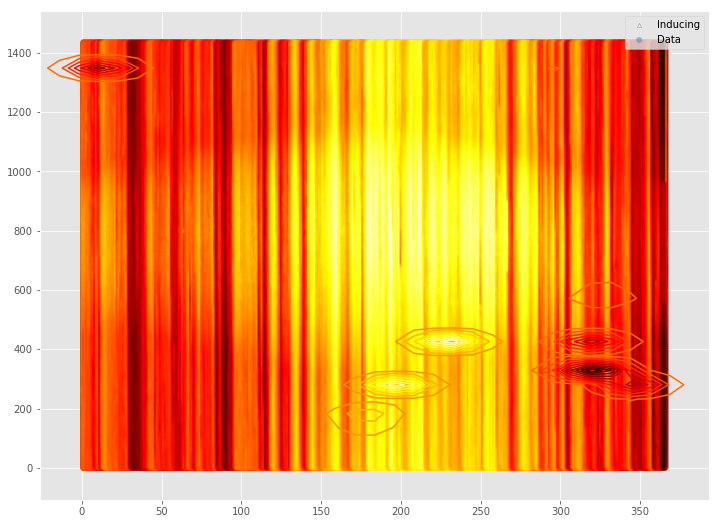

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    01s05  0001   1.768549e+07   1.167299e+14 
    10s78  0013   1.501742e+06   4.706305e+07 
    17s41  0022   1.464826e+06   1.998535e-04 
Runtime:     17s41
Optimization status: Converged

Optimization restart 1/1, f = 1464826.1783534952


sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
rbf.variance,9.28079804976e-09,+ve,
rbf.lengthscale,44.2449649149,+ve,
Gaussian_noise.variance,62.2130703543,+ve,


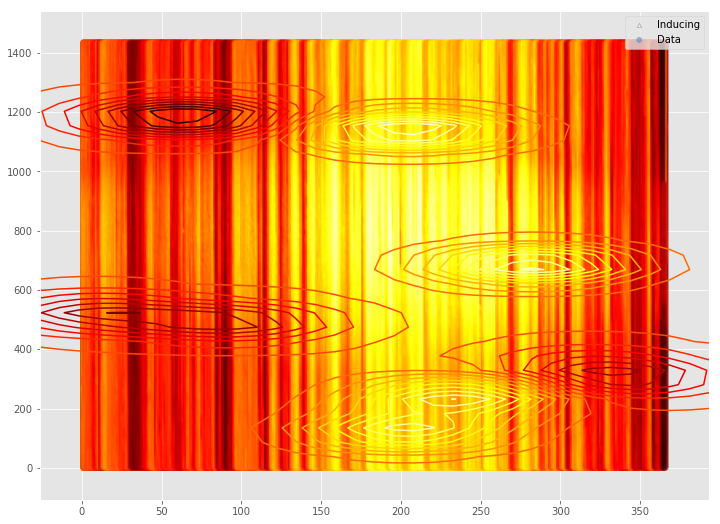

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    04s92  0006   3.704786e+06   2.086475e+11 
    06s79  0008   2.566672e+06   2.093637e+10 
    11s91  0014   1.426237e+06   1.164087e+07 
    16s27  0020   1.397855e+06   1.490173e+05 
    49s53  0060   1.338667e+06   3.426982e+05 
 01m00s44  0072   1.332872e+06   9.331313e+03 
 02m38s14  0204   1.326432e+06   6.346922e+04 
 06m44s37  0507   1.305854e+06   1.097349e+05 
 09m28s37  0719   1.301152e+06   1.236763e+04 
 13m15s85  1002   1.300214e+06   9.294448e+01 
Runtime:  13m15s85
Optimization status: Maximum number of f evaluations reached

Optimization restart 1/1, f = 1300214.1569630774


sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
rbf.variance,1455.73988029,+ve,
rbf.lengthscale,679.764602922,+ve,
Gaussian_noise.variance,27.912390206,+ve,


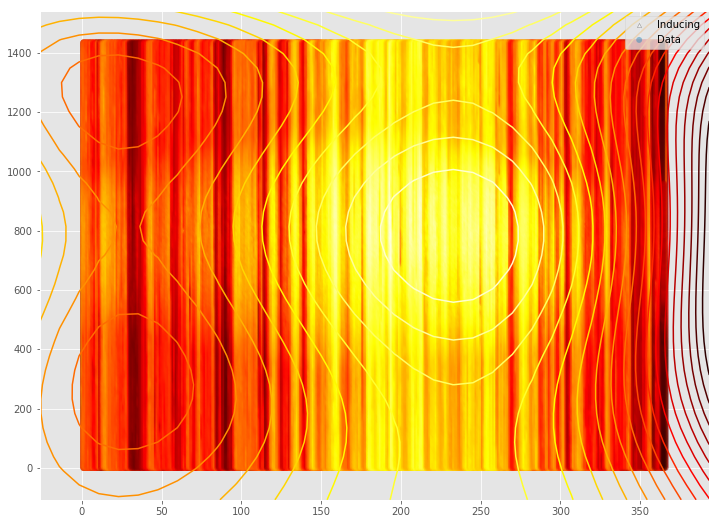

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    02s92  0004   6.336440e+06   2.493730e+12 
    08s75  0012   1.666006e+06   2.091997e+08 
    20s91  0030   1.412433e+06   1.469165e+06 
    27s84  0040   1.379958e+06   1.402796e+05 
    38s67  0056   1.369237e+06   6.513799e+04 
 01m51s80  0160   1.362263e+06   3.705575e+06 
 05m10s88  0450   1.358350e+06   4.681433e+06 
 07m59s00  0694   1.354403e+06   1.028903e+04 
 09m28s77  0824   1.354349e+06   2.386782e+02 
 09m30s96  0827   1.354349e+06   1.782449e+01 
Runtime:  09m30s96
Optimization status: Converged

Optimization restart 1/1, f = 1354348.9093129185


sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
rbf.variance,0.380041153925,+ve,
rbf.lengthscale,79.9686974782,+ve,
Gaussian_noise.variance,36.4923056788,+ve,


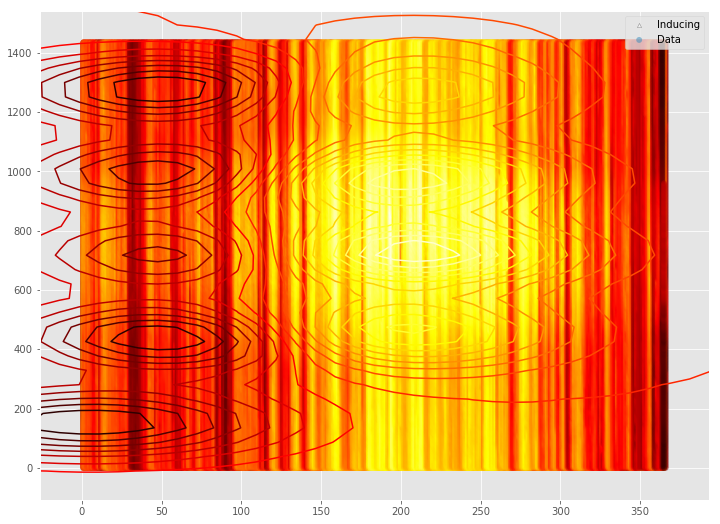

Running L-BFGS-B (Scipy implementation) Code:
  runtime   i      f              |g|        
    04s06  0006   3.489152e+06   1.777463e+11 
    08s13  0012   1.578400e+06   1.428312e+08 
    13s52  0020   1.417526e+06   1.680128e+05 
    38s69  0056   1.367112e+06   4.357536e+05 
    57s68  0084   1.352819e+06   5.819264e+04 
 02m48s97  0238   1.346663e+06   4.888892e+06 
 05m24s70  0446   1.346020e+06   2.741827e+03 
 09m50s29  0778   1.345696e+06   2.239574e+04 
Runtime:  09m50s29
Optimization status: Converged

Optimization restart 1/1, f = 1345696.319866633


sparse_gp.,value,constraints,priors
inducing inputs,"(10, 2)",,
rbf.variance,0.406327106246,+ve,
rbf.lengthscale,83.8051514406,+ve,
Gaussian_noise.variance,34.9981970322,+ve,


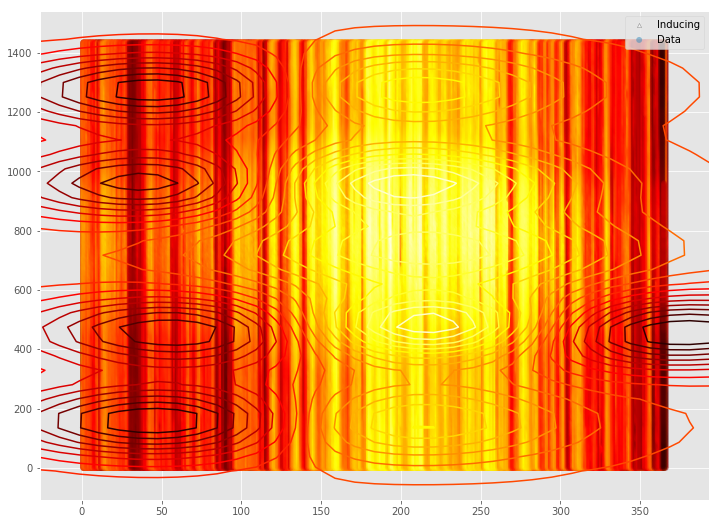

In [82]:
NUM_INITS = 5

init_results = defaultdict(dict)
init_model_names = []

for i in range(NUM_INITS):
    var, ls = np.random.uniform(1, 50, 2)

    train_and_time_model('var={var:.3f}, ls={ls:.3f}'.format(var=var, ls=ls), 
                         GPy.kern.RBF(dim, var, ls),
                         num_restarts=1, result_dict=init_results, 
                         model_name_list=init_model_names)

In [83]:
header = ['Metric'] + init_model_names
table = [[key] + [init_results[model][key] for model in init_results] for key in RESULT_KEYS]

print(tabulate.tabulate(table, header, tablefmt='html'))

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  var=39.191, ls=6.265</th><th style="text-align: right;">  var=27.528, ls=34.663</th><th style="text-align: right;">  var=32.916, ls=43.624</th><th style="text-align: right;">  var=34.898, ls=24.528</th><th style="text-align: right;">  var=28.205, ls=41.164</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">          18.344      </td><td style="text-align: right;">           19.9592     </td><td style="text-align: right;">          798.08       </td><td style="text-align: right;">          573.15       </td><td style="text-align: right;">           592.6       </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;">          -1.46483e+06</td><td style="text-align: right;">           -1.46483e+06</td><td style="text-align: right;">           -1.30021e+06</td><td style="text-align: right;">           -1.35435e+06</td><td style="text-align: r

<table>
<thead>
<tr><th>Metric                 </th><th style="text-align: right;">  var=39.191, ls=6.265</th><th style="text-align: right;">  var=27.528, ls=34.663</th><th style="text-align: right;">  var=32.916, ls=43.624</th><th style="text-align: right;">  var=34.898, ls=24.528</th><th style="text-align: right;">  var=28.205, ls=41.164</th></tr>
</thead>
<tbody>
<tr><td>Train time             </td><td style="text-align: right;">          18.344      </td><td style="text-align: right;">           19.9592     </td><td style="text-align: right;">          798.08       </td><td style="text-align: right;">          573.15       </td><td style="text-align: right;">           592.6       </td></tr>
<tr><td>Train log likelihood   </td><td style="text-align: right;">          -1.46483e+06</td><td style="text-align: right;">           -1.46483e+06</td><td style="text-align: right;">           -1.30021e+06</td><td style="text-align: right;">           -1.35435e+06</td><td style="text-align: right;">            -1.3457e+06</td></tr>
<tr><td>Train predict time     </td><td style="text-align: right;">           0.21918    </td><td style="text-align: right;">            0.217297   </td><td style="text-align: right;">            0.196996   </td><td style="text-align: right;">            0.198611   </td><td style="text-align: right;">             0.225253  </td></tr>
<tr><td>Train MSE              </td><td style="text-align: right;">          62.2132     </td><td style="text-align: right;">           62.2132     </td><td style="text-align: right;">           27.5977     </td><td style="text-align: right;">           36.2116     </td><td style="text-align: right;">            34.7324    </td></tr>
<tr><td>Validation predict time</td><td style="text-align: right;">           0.0571308  </td><td style="text-align: right;">            0.0696655  </td><td style="text-align: right;">            0.0540735  </td><td style="text-align: right;">            0.0538602  </td><td style="text-align: right;">             0.0567872 </td></tr>
<tr><td>MSE                    </td><td style="text-align: right;">          57.0997     </td><td style="text-align: right;">           57.0997     </td><td style="text-align: right;">           26.4692     </td><td style="text-align: right;">           42.9231     </td><td style="text-align: right;">            39.4853    </td></tr>
<tr><td>MeanAE                 </td><td style="text-align: right;">           6.14151    </td><td style="text-align: right;">            6.14151    </td><td style="text-align: right;">            4.15118    </td><td style="text-align: right;">            5.16631    </td><td style="text-align: right;">             4.89984   </td></tr>
<tr><td>MedianAE               </td><td style="text-align: right;">           5.38143    </td><td style="text-align: right;">            5.38143    </td><td style="text-align: right;">            3.6365     </td><td style="text-align: right;">            4.26439    </td><td style="text-align: right;">             3.9904    </td></tr>
</tbody>
</table>